In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
warnings.filterwarnings('ignore')

In [4]:
df = pd.read_csv("credit_risk_dataset.csv")

In [3]:
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4
...,...,...,...,...,...,...,...,...,...,...,...,...
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26


# About Dataset

| **Column Name** | **Meaning / Description** |
|------------------|----------------------------|
| **person_age** | Age of the person who applied for the loan. |
| **person_income** | The applicant’s annual income (usually in dollars). |
| **person_home_ownership** | Shows the person’s home ownership status — whether they rent, own, have a mortgage, or something else. |
| **person_emp_length** | Number of years the person has been employed. |
| **loan_intent** | Purpose or reason for taking the loan. |
| **loan_grade** | A credit risk grade assigned by the lender based on the borrower’s profile. |
| **loan_amnt** | The amount of money the person wants to borrow. |
| **loan_int_rate** | The interest rate applied to the loan (as a percentage). |
| **loan_status** | Indicates whether the loan is approved, paid, defaulted, or charged off. |
| **loan_percent_income** | The ratio of the loan amount to the person’s income (loan_amnt / person_income). |
| **cb_person_default_on_file** | Shows whether the person has ever defaulted on a previous credit or loan. |
| **cb_person_cred_hist_length** | The length of the person’s credit history in years. |


# EDA

In [4]:
df.shape

(32581, 12)

In [5]:
df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [6]:
df.tail()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
32576,57,53000,MORTGAGE,1.0,PERSONAL,C,5800,13.16,0,0.11,N,30
32577,54,120000,MORTGAGE,4.0,PERSONAL,A,17625,7.49,0,0.15,N,19
32578,65,76000,RENT,3.0,HOMEIMPROVEMENT,B,35000,10.99,1,0.46,N,28
32579,56,150000,MORTGAGE,5.0,PERSONAL,B,15000,11.48,0,0.10,N,26
32580,66,42000,RENT,2.0,MEDICAL,B,6475,9.99,0,0.15,N,30


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [7]:
df['loan_intent'].value_counts()

loan_intent
EDUCATION            6453
MEDICAL              6071
VENTURE              5719
PERSONAL             5521
DEBTCONSOLIDATION    5212
HOMEIMPROVEMENT      3605
Name: count, dtype: int64

In [5]:
df['person_home_ownership'].value_counts()

person_home_ownership
RENT        16446
MORTGAGE    13444
OWN          2584
OTHER         107
Name: count, dtype: int64

In [8]:
df.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [9]:
df.isnull().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              895
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3116
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

In [10]:
df.drop_duplicates(inplace = True)
df.reset_index(drop=True, inplace=True)

In [11]:
df.shape

(32416, 12)

# Data Visualization

In [12]:
# Funtion for visulaizing the distribution of numerical column

def distribution(col):
  plt.figure(figsize=(8,8))
  plt.subplot(2,2,1)
  sns.histplot(data = df, x = col, color="pink", edgecolor="red")
  plt.title(f"Distribution of {col}")
  plt.xlabel(f"{col}")

  plt.subplot(2,2,2)
  sns.boxplot(data = df, y = col, color="red",)
  plt.title(f"Boxplot of {col}")
  plt.xlabel(f"{col}")


  plt.subplot(2,2,3)
  sns.violinplot(data = df, y = col, color="pink")
  plt.title(f"Violinplot of {col}")
  plt.xlabel(f"{col}")

  plt.subplot(2,2,4)
  sns.kdeplot(data = df, x = col, color="pink", edgecolor = "red", fill=True)
  plt.title(f"Countplot of {col}")
  plt.xlabel(f"{col}")
  plt.tight_layout()
  plt.show()


In [13]:
num_col = df.select_dtypes(['int', 'float']).columns

In [14]:
num_col

Index(['person_age', 'person_income', 'person_emp_length', 'loan_amnt',
       'loan_int_rate', 'loan_status', 'loan_percent_income',
       'cb_person_cred_hist_length'],
      dtype='object')

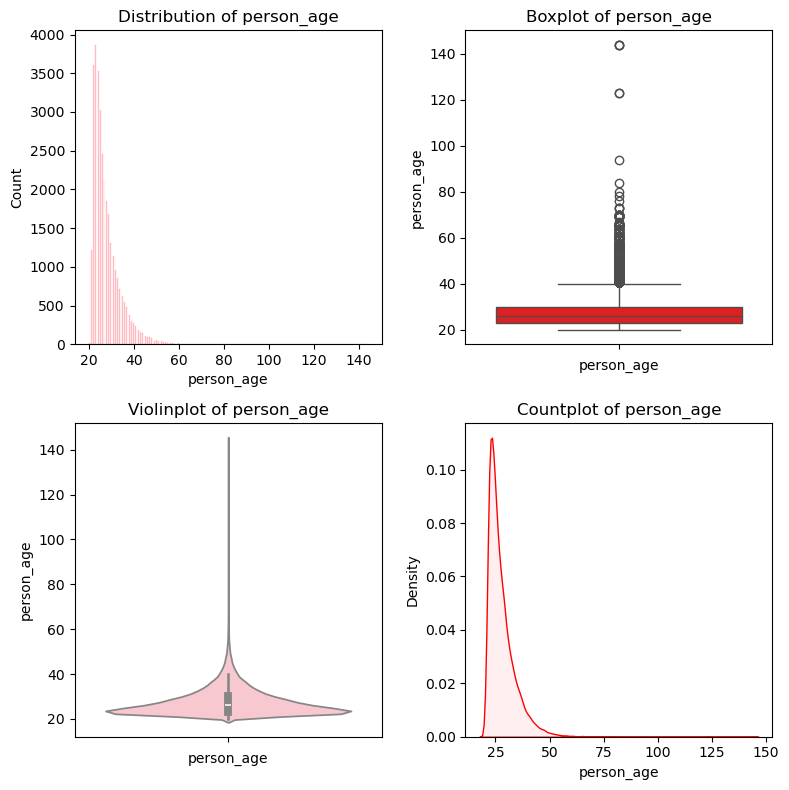

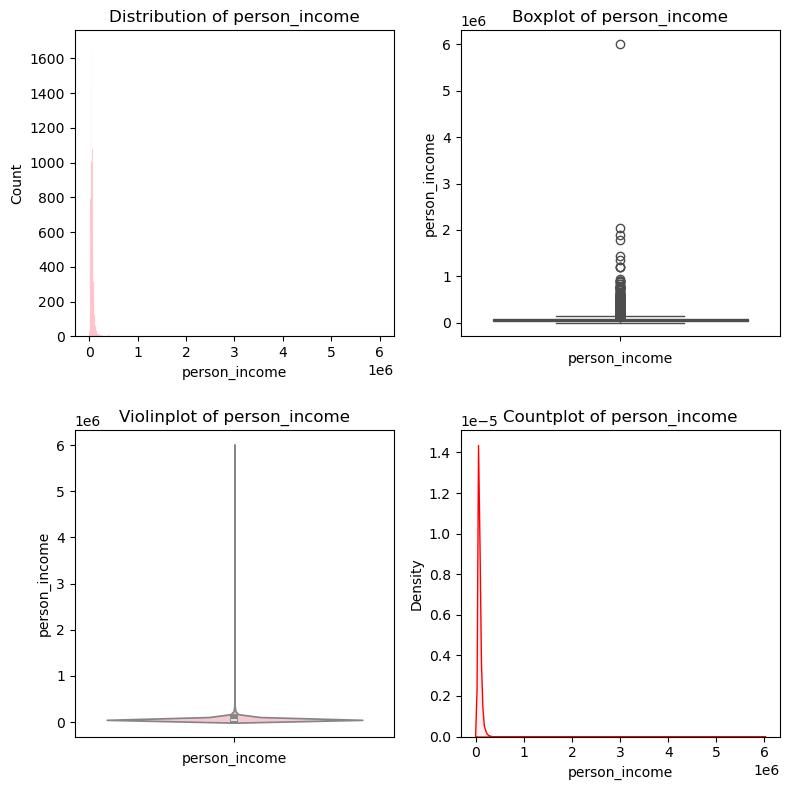

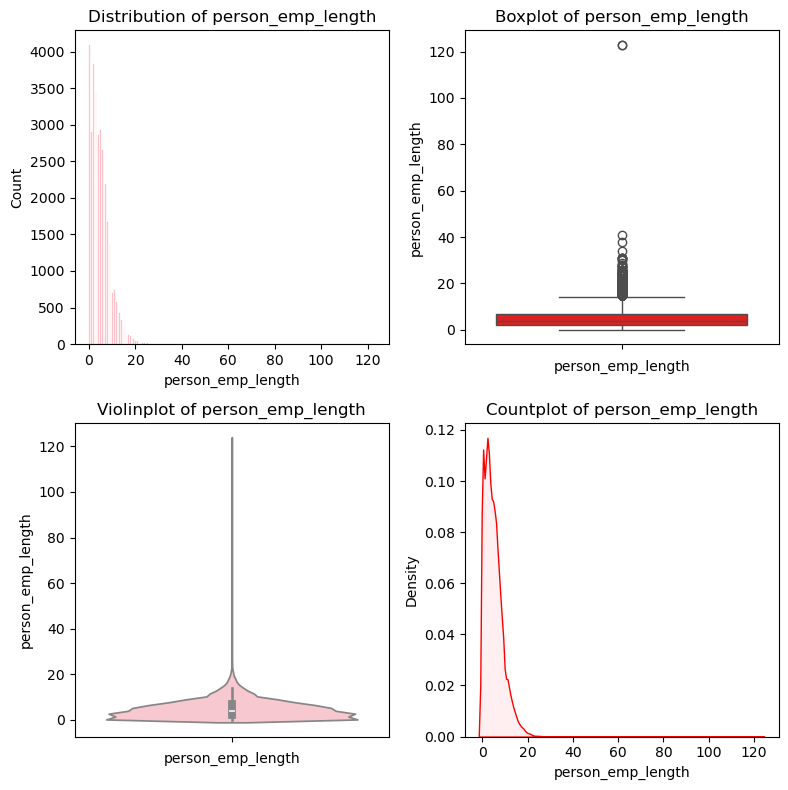

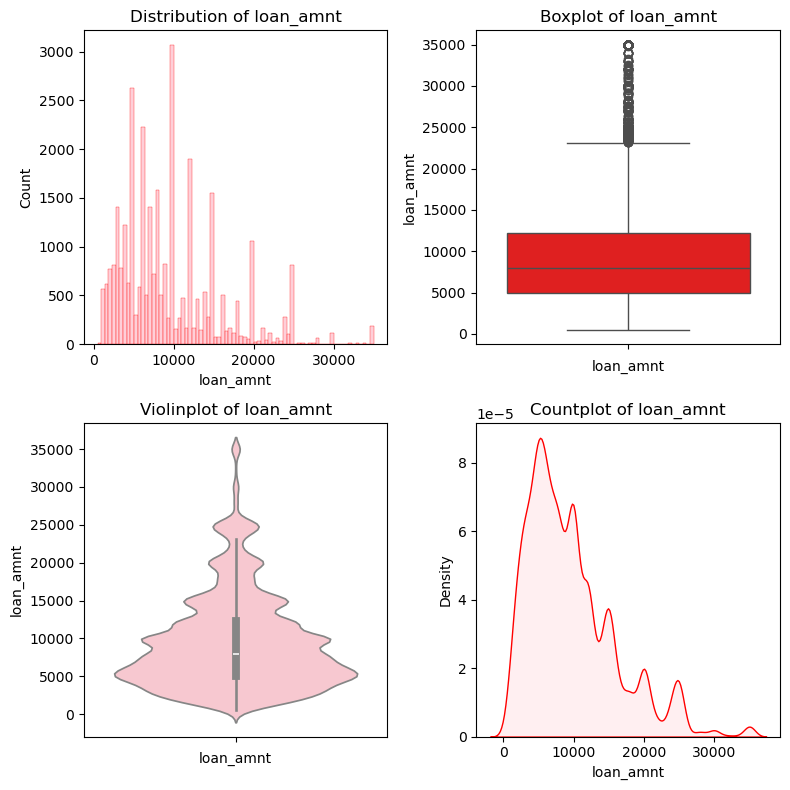

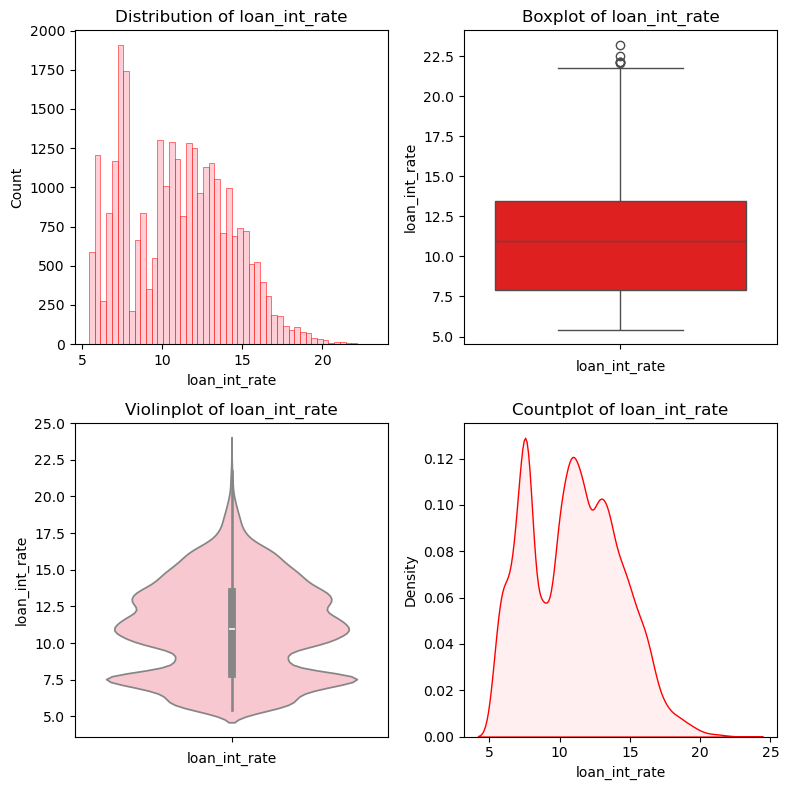

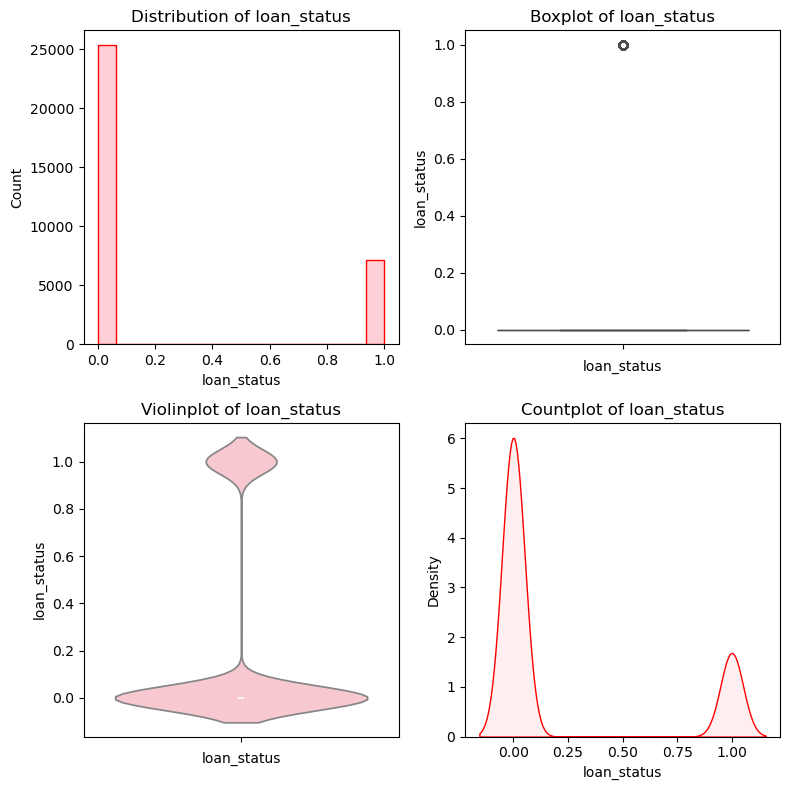

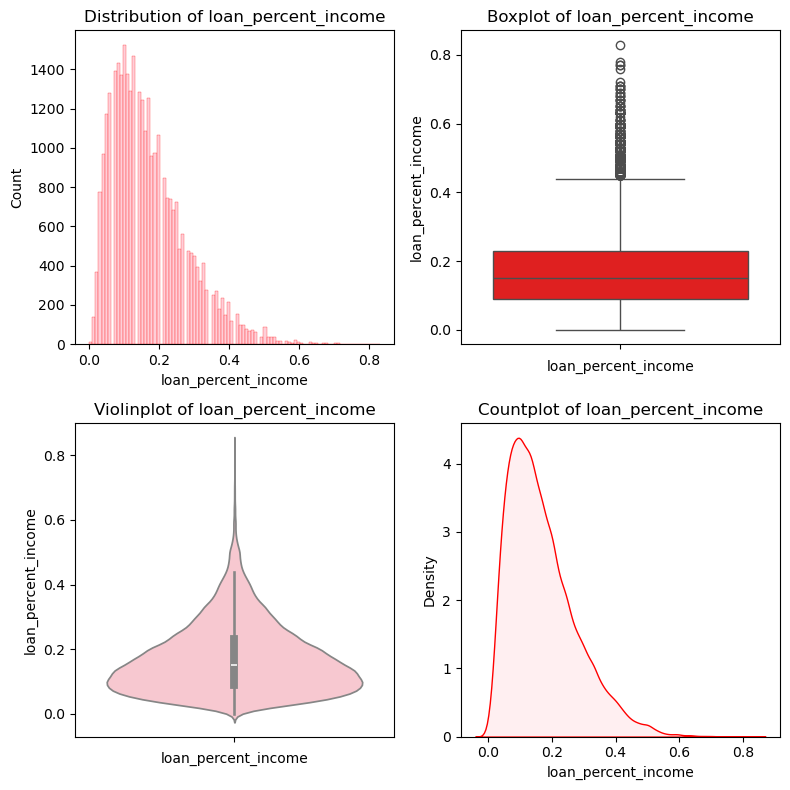

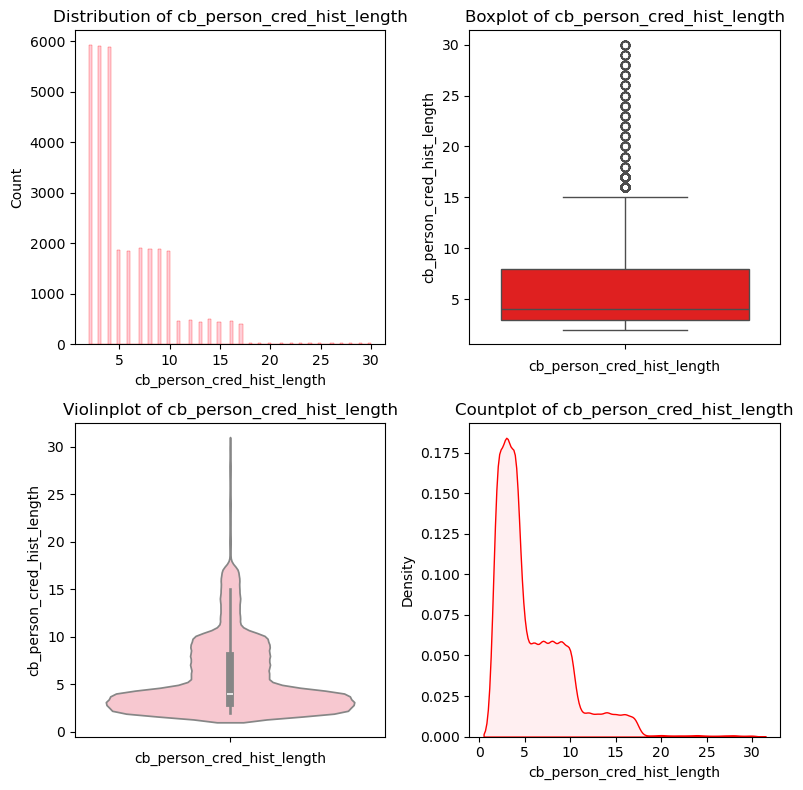

In [15]:
for col in num_col:
  distribution(col)
  print("\n\n")

In [16]:
cat_col = df.select_dtypes(['object']).columns

In [17]:
cat_col

Index(['person_home_ownership', 'loan_intent', 'loan_grade',
       'cb_person_default_on_file'],
      dtype='object')

In [18]:
def count(col):
  plt.figure(figsize=(5,5))
  sns.countplot(data = df, x = col, palette="rainbow")
  plt.title(f"Countplot of {col}")
  plt.ylabel("Count")
  plt.xticks(rotation=45)
  plt.xlabel(f"{col}")
  plt.tight_layout()
  plt.show()

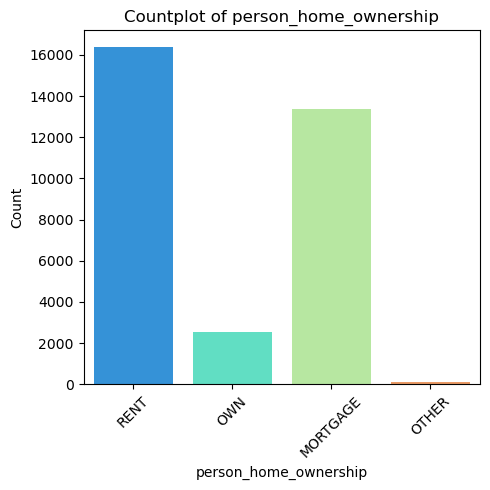

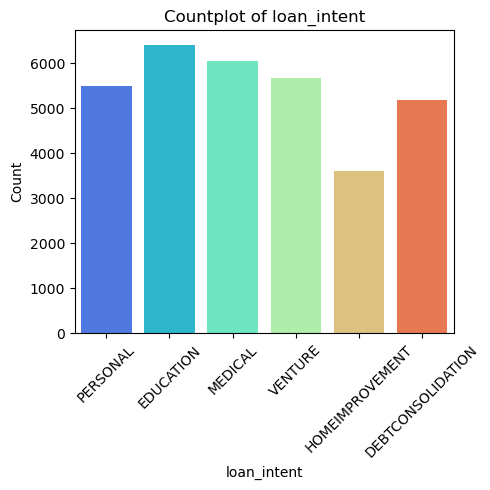

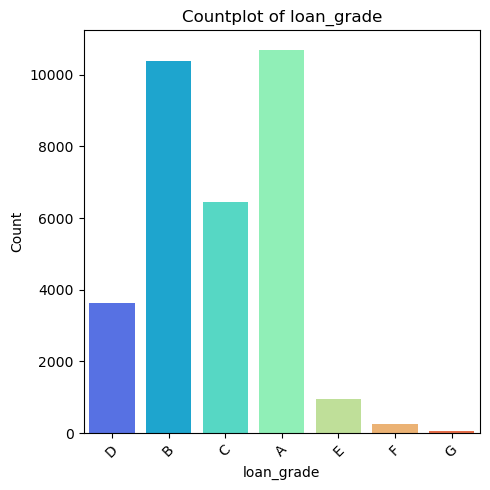

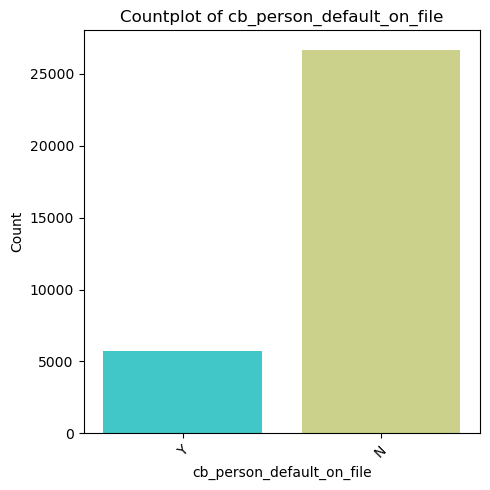

In [19]:
for col in cat_col:
  count(col)
  print("\n\n")

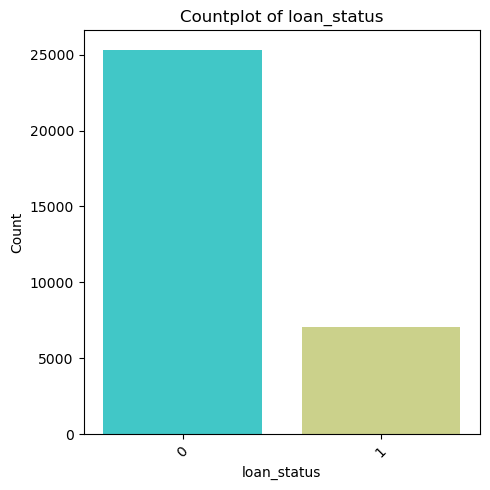

In [20]:
count("loan_status")

In [21]:
df['loan_status'].value_counts()

loan_status
0    25327
1     7089
Name: count, dtype: int64

In [22]:
df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


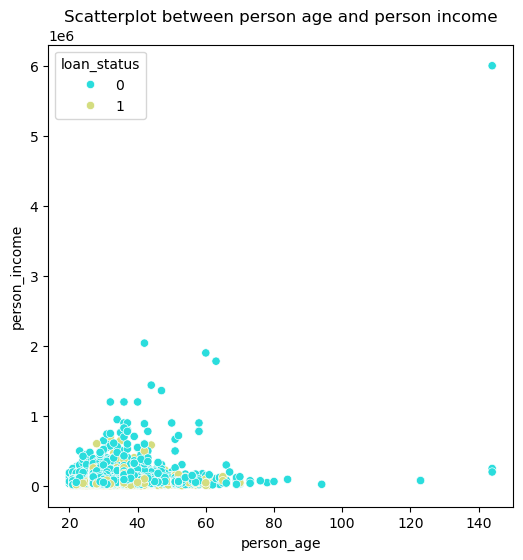

In [23]:
# scatter plot between person age and person income

plt.figure(figsize=(6,6))
sns.scatterplot(data = df, x = "person_age", y = "person_income", hue = "loan_status", palette="rainbow")
plt.title("Scatterplot between person age and person income")
plt.xlabel("person_age")
plt.ylabel("person_income")
plt.show()

In [24]:
# replacing age outlier with mean age


In [25]:
mean_age = int(df['person_age'].mean())
df['person_age'] = df['person_age'].apply(lambda x: mean_age if x > 90 else x)

In [26]:
# scatter plot between income and loan ammount

fig = px.scatter(df, x = "person_income", y = "loan_amnt", color = "loan_status", title = "Scatterplot between income and loan ammount")
fig

In [27]:
fig = px.box(df, x='loan_status', y='person_income', title='Box Plot of Loan Amount by Loan Status')
fig.show()

In [28]:
fig = px.box(df, x='loan_status', y='loan_amnt', title='Box Plot of Income by Loan Status')
fig.show()

In [29]:
df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [30]:
fig = px.box(df, y = 'loan_int_rate',color = 'loan_grade', title='Box Plot of Loan Amount by Loan Status')
fig.show()

In [31]:
fig = px.box(df, y = 'loan_amnt', color = 'loan_grade', title='Box Plot of Loan Amount by Loan Status')
fig.show()

In [32]:
fig = px.box(df, y = 'loan_amnt', color = 'loan_intent', title='Box Plot of Loan Amount by Loan Status')
fig.show()

In [33]:
fig = px.scatter(df, x = 'person_emp_length', y = 'loan_amnt')
fig.show()

In [34]:
df['person_emp_length'] = df['person_emp_length'].apply(lambda x: df['person_emp_length'].mean() if x > 100 else x)

# Imputing missing value

**Using KNN imputer to impute missing value from loan_int_rate and 'person_emp_length**

In [35]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)
df[['loan_int_rate','person_emp_length']] = imputer.fit_transform(df[['loan_int_rate','person_emp_length']])

In [36]:
df.isnull().sum()

person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_status                   0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
dtype: int64

In [37]:
df['cb_person_default_on_file'] = df['cb_person_default_on_file'].map({'Y': 1, 'N': 0})

# Feature Engineering and Preprocessing

In [38]:
# Converting emp_length_length to bins

df['emp_length_cat'] = pd.cut(df['person_emp_length'],
                              bins=[0,1,5,10,20,50],
                              labels=['lessthan1yr','1to5yr','5to10yr','10to20yr','greatheerthan20yr'])


In [39]:
df['emp_length_cat'].dtype

CategoricalDtype(categories=['lessthan1yr', '1to5yr', '5to10yr', '10to20yr',
                  'greatheerthan20yr'],
, ordered=True, categories_dtype=object)

In [40]:
df['emp_length_cat'] = df['emp_length_cat'].astype('object')

In [41]:
cat_col = df.select_dtypes(['object']).columns.tolist()
# Remove 'emp_length_cat' if it's already in the list from select_dtypes
if 'emp_length_cat' in cat_col:
    cat_col.remove('emp_length_cat')
cat_col.append('emp_length_cat')

In [42]:
cat_col

['person_home_ownership', 'loan_intent', 'loan_grade', 'emp_length_cat']

In [43]:
num_col = list(num_col)
num_col.remove('loan_status')

In [44]:
df.isnull().sum(

)

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length                0
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                    0
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
emp_length_cat                4092
dtype: int64

In [45]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder()
encoded_df = pd.DataFrame(encoder.fit_transform(df[cat_col]).toarray(), columns=encoder.get_feature_names_out())


In [46]:
cat_col = encoded_df.columns.tolist()

In [47]:
df_encoded = pd.concat([df.select_dtypes(include=np.number), encoded_df], axis=1)
display(df_encoded.head())

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,...,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,emp_length_cat_10to20yr,emp_length_cat_1to5yr,emp_length_cat_5to10yr,emp_length_cat_greatheerthan20yr,emp_length_cat_lessthan1yr,emp_length_cat_nan
0,22,59000,4.79051,35000,16.02,1,0.59,1,3,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,21,9600,5.00000,1000,11.14,0,0.10,0,2,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,25,9600,1.00000,5500,12.87,1,0.57,0,3,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,23,65500,4.00000,35000,15.23,1,0.53,0,2,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,24,54400,8.00000,35000,14.27,1,0.55,1,4,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [48]:
df_encoded

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,...,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,emp_length_cat_10to20yr,emp_length_cat_1to5yr,emp_length_cat_5to10yr,emp_length_cat_greatheerthan20yr,emp_length_cat_lessthan1yr,emp_length_cat_nan
0,22,59000,4.79051,35000,16.02,1,0.59,1,3,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,21,9600,5.00000,1000,11.14,0,0.10,0,2,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,25,9600,1.00000,5500,12.87,1,0.57,0,3,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,23,65500,4.00000,35000,15.23,1,0.53,0,2,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,24,54400,8.00000,35000,14.27,1,0.55,1,4,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32411,57,53000,1.00000,5800,13.16,0,0.11,0,30,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
32412,54,120000,4.00000,17625,7.49,0,0.15,0,19,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
32413,65,76000,3.00000,35000,10.99,1,0.46,0,28,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
32414,56,150000,5.00000,15000,11.48,0,0.10,0,26,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [49]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_encoded[num_col] = scaler.fit_transform(df_encoded[num_col])

In [50]:
df_encoded.head()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,...,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,emp_length_cat_10to20yr,emp_length_cat_1to5yr,emp_length_cat_5to10yr,emp_length_cat_greatheerthan20yr,emp_length_cat_lessthan1yr,emp_length_cat_nan
0,-0.924056,-0.114354,0.000999,4.018287,1.598475,1,3.929865,1,-0.692614,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,-1.085374,-0.910941,0.053406,-1.359219,0.036953,0,-0.657707,0,-0.938982,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,-0.440104,-0.910941,-0.947240,-0.647491,0.590525,1,3.742617,0,-0.692614,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,-0.762739,-0.009540,-0.196756,4.018287,1.345687,1,3.368121,0,-0.938982,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,-0.601422,-0.188530,0.803890,4.018287,1.038503,1,3.555369,1,-0.446246,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [51]:
df_encoded.shape

(32416, 32)

In [52]:
df_encoded.isnull().sum()

person_age                          0
person_income                       0
person_emp_length                   0
loan_amnt                           0
loan_int_rate                       0
loan_status                         0
loan_percent_income                 0
cb_person_default_on_file           0
cb_person_cred_hist_length          0
person_home_ownership_MORTGAGE      0
person_home_ownership_OTHER         0
person_home_ownership_OWN           0
person_home_ownership_RENT          0
loan_intent_DEBTCONSOLIDATION       0
loan_intent_EDUCATION               0
loan_intent_HOMEIMPROVEMENT         0
loan_intent_MEDICAL                 0
loan_intent_PERSONAL                0
loan_intent_VENTURE                 0
loan_grade_A                        0
loan_grade_B                        0
loan_grade_C                        0
loan_grade_D                        0
loan_grade_E                        0
loan_grade_F                        0
loan_grade_G                        0
emp_length_c

In [53]:
cat_col = [col for col in df_encoded.columns if col not in num_col]

In [54]:
cat_col

['loan_status',
 'cb_person_default_on_file',
 'person_home_ownership_MORTGAGE',
 'person_home_ownership_OTHER',
 'person_home_ownership_OWN',
 'person_home_ownership_RENT',
 'loan_intent_DEBTCONSOLIDATION',
 'loan_intent_EDUCATION',
 'loan_intent_HOMEIMPROVEMENT',
 'loan_intent_MEDICAL',
 'loan_intent_PERSONAL',
 'loan_intent_VENTURE',
 'loan_grade_A',
 'loan_grade_B',
 'loan_grade_C',
 'loan_grade_D',
 'loan_grade_E',
 'loan_grade_F',
 'loan_grade_G',
 'emp_length_cat_10to20yr',
 'emp_length_cat_1to5yr',
 'emp_length_cat_5to10yr',
 'emp_length_cat_greatheerthan20yr',
 'emp_length_cat_lessthan1yr',
 'emp_length_cat_nan']

**Checking corelation between other column and target column**

In [55]:
from scipy.stats import pearsonr

numerical_features = df.select_dtypes(include=np.number).columns.tolist()
selected_feature = [col for col in numerical_features if col != 'loan_status']


correlation = {
    feature : pearsonr(df_encoded[feature], df_encoded['loan_status'])[0]
    for feature in selected_feature
}

correlation_df = pd.DataFrame(list(correlation.items()), columns=['feature', 'correlation'])
correlation_df = correlation_df.sort_values(by='correlation', ascending=False)
correlation_df

,feature,correlation
5,loan_percent_income,0.379697
4,loan_int_rate,0.312930
6,cb_person_default_on_file,0.179385
3,loan_amnt,0.105736
7,cb_person_cred_hist_length,-0.016498
0,person_age,-0.021660
2,person_emp_length,-0.085019
1,person_income,-0.145005


In [56]:
df_encoded

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,...,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,emp_length_cat_10to20yr,emp_length_cat_1to5yr,emp_length_cat_5to10yr,emp_length_cat_greatheerthan20yr,emp_length_cat_lessthan1yr,emp_length_cat_nan
0,-0.924056,-0.114354,0.000999,4.018287,1.598475,1,3.929865,1,-0.692614,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,-1.085374,-0.910941,0.053406,-1.359219,0.036953,0,-0.657707,0,-0.938982,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,-0.440104,-0.910941,-0.947240,-0.647491,0.590525,1,3.742617,0,-0.692614,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,-0.762739,-0.009540,-0.196756,4.018287,1.345687,1,3.368121,0,-0.938982,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,-0.601422,-0.188530,0.803890,4.018287,1.038503,1,3.555369,1,-0.446246,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32411,4.722050,-0.211106,-0.947240,-0.600042,0.683321,0,-0.564083,0,5.959324,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
32412,4.238098,0.869285,-0.196756,1.270223,-1.130989,0,-0.189587,0,3.249275,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
32413,6.012588,0.159775,-0.446917,4.018287,-0.011045,1,2.712754,0,5.466588,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
32414,4.560733,1.353041,0.053406,0.855048,0.145747,0,-0.657707,0,4.973852,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [57]:
df_encoded

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,person_home_ownership_MORTGAGE,...,loan_grade_D,loan_grade_E,loan_grade_F,loan_grade_G,emp_length_cat_10to20yr,emp_length_cat_1to5yr,emp_length_cat_5to10yr,emp_length_cat_greatheerthan20yr,emp_length_cat_lessthan1yr,emp_length_cat_nan
0,-0.924056,-0.114354,0.000999,4.018287,1.598475,1,3.929865,1,-0.692614,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,-1.085374,-0.910941,0.053406,-1.359219,0.036953,0,-0.657707,0,-0.938982,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,-0.440104,-0.910941,-0.947240,-0.647491,0.590525,1,3.742617,0,-0.692614,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,-0.762739,-0.009540,-0.196756,4.018287,1.345687,1,3.368121,0,-0.938982,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,-0.601422,-0.188530,0.803890,4.018287,1.038503,1,3.555369,1,-0.446246,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32411,4.722050,-0.211106,-0.947240,-0.600042,0.683321,0,-0.564083,0,5.959324,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
32412,4.238098,0.869285,-0.196756,1.270223,-1.130989,0,-0.189587,0,3.249275,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
32413,6.012588,0.159775,-0.446917,4.018287,-0.011045,1,2.712754,0,5.466588,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
32414,4.560733,1.353041,0.053406,0.855048,0.145747,0,-0.657707,0,4.973852,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [58]:
cat_col.remove('loan_status')

In [59]:
cat_col = list(set(cat_col))  # remove duplicates


In [60]:
from scipy.stats import chi2_contingency

alpha = 0.05
chi_result = {}

for col in cat_col:
    try:
        contingency_table = pd.crosstab(df_encoded[col], df_encoded['loan_status'])
        chi2, p, _, _ = chi2_contingency(contingency_table)
        decision = 'Reject Null Hypothesis(Keep Feature)' if p < alpha else 'Accept Null(Drop Feature)'
        chi_result[col] = {'chi2': chi2, 'p_value': p, 'decision': decision}
    except Exception as e:
        print(f"⚠️ Error in column: {col} → {e}")


In [61]:
df_encoded = df_encoded.loc[:, ~df_encoded.columns.duplicated()]


In [62]:
from scipy.stats import chi2_contingency

alpha = 0.05
chi_result = {}

# apply chi square test
for col in cat_col:
    contingency_table = pd.crosstab(df_encoded[col], df_encoded['loan_status'])
    chi2, p, _, _ = chi2_contingency(contingency_table)
    decision = 'Reject Null Hypothesis(Keep Feature)' if p < alpha else 'Accept Null(Drop Feature)'
    chi_result[col] = {'chi2': chi2, 'p_value': p, 'decision': decision}


chi_result_df = pd.DataFrame(chi_result).T
chi_result_df = chi_result_df.sort_values(by='p_value')
chi_result_df

,chi2,p_value,decision
person_home_ownership_RENT,1837.060431,0.0,Reject Null Hypothesis(Keep Feature)
loan_grade_D,3296.560568,0.0,Reject Null Hypothesis(Keep Feature)
loan_grade_A,1325.273347,0.0,Reject Null Hypothesis(Keep Feature)
person_home_ownership_MORTGAGE,1138.471352,0.0,Reject Null Hypothesis(Keep Feature)
loan_grade_E,1052.406994,0.0,Reject Null Hypothesis(Keep Feature)
cb_person_default_on_file,1041.973789,0.0,Reject Null Hypothesis(Keep Feature)
person_home_ownership_OWN,335.787212,0.0,Reject Null Hypothesis(Keep Feature)
loan_grade_F,333.757298,0.0,Reject Null Hypothesis(Keep Feature)
loan_grade_B,275.101406,0.0,Reject Null Hypothesis(Keep Feature)
loan_grade_G,215.567174,0.0,Reject Null Hypothesis(Keep Feature)


In [63]:
cat_col = list(set(cat_col))

In [64]:
chi_col = chi_result_df[chi_result_df['decision'] == 'Reject Null Hypothesis(Keep Feature)'].index.tolist()
chi_col

['person_home_ownership_RENT',
 'loan_grade_D',
 'loan_grade_A',
 'person_home_ownership_MORTGAGE',
 'loan_grade_E',
 'cb_person_default_on_file',
 'person_home_ownership_OWN',
 'loan_grade_F',
 'loan_grade_B',
 'loan_grade_G',
 'loan_intent_VENTURE',
 'loan_intent_DEBTCONSOLIDATION',
 'emp_length_cat_nan',
 'loan_intent_MEDICAL',
 'loan_intent_EDUCATION',
 'emp_length_cat_5to10yr',
 'emp_length_cat_lessthan1yr',
 'emp_length_cat_10to20yr',
 'loan_intent_HOMEIMPROVEMENT',
 'loan_intent_PERSONAL',
 'loan_grade_C',
 'person_home_ownership_OTHER']

In [65]:
high_correlation_features = correlation_df[abs(correlation_df['correlation']) > 0.23]
high_correlation_features = high_correlation_features['feature'].tolist()

In [66]:
high_correlation_features

['loan_percent_income', 'loan_int_rate']

In [67]:
final_feature = chi_col + high_correlation_features

In [68]:
final_feature

['person_home_ownership_RENT',
 'loan_grade_D',
 'loan_grade_A',
 'person_home_ownership_MORTGAGE',
 'loan_grade_E',
 'cb_person_default_on_file',
 'person_home_ownership_OWN',
 'loan_grade_F',
 'loan_grade_B',
 'loan_grade_G',
 'loan_intent_VENTURE',
 'loan_intent_DEBTCONSOLIDATION',
 'emp_length_cat_nan',
 'loan_intent_MEDICAL',
 'loan_intent_EDUCATION',
 'emp_length_cat_5to10yr',
 'emp_length_cat_lessthan1yr',
 'emp_length_cat_10to20yr',
 'loan_intent_HOMEIMPROVEMENT',
 'loan_intent_PERSONAL',
 'loan_grade_C',
 'person_home_ownership_OTHER',
 'loan_percent_income',
 'loan_int_rate']

# Model Selection and Evaluation

In [69]:
final_df = df_encoded[final_feature + ['loan_status']]

In [70]:
final_df.head()

,person_home_ownership_RENT,loan_grade_D,loan_grade_A,person_home_ownership_MORTGAGE,loan_grade_E,cb_person_default_on_file,person_home_ownership_OWN,loan_grade_F,loan_grade_B,loan_grade_G,...,emp_length_cat_5to10yr,emp_length_cat_lessthan1yr,emp_length_cat_10to20yr,loan_intent_HOMEIMPROVEMENT,loan_intent_PERSONAL,loan_grade_C,person_home_ownership_OTHER,loan_percent_income,loan_int_rate,loan_status
0,1.0,1.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3.929865,1.598475,1
1,0.0,0.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.657707,0.036953,0
2,0.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,3.742617,0.590525,1
3,1.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.368121,1.345687,1
4,1.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,3.555369,1.038503,1


In [71]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, f1_score, recall_score, precision_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier

X = final_df.drop('loan_status', axis=1)
y = final_df['loan_status']

In [72]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [73]:
models = [
    LogisticRegression(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    SVC(),
    KNeighborsClassifier(),
    XGBClassifier()
]

f1 = []
precision = []
recall = []
accuracy = []

In [74]:
for model in models:
  model.fit(X_train,y_train)
  y_pred = model.predict(X_test)
  f1.append(f1_score(y_test,y_pred))
  precision.append(precision_score(y_test,y_pred))
  recall.append(recall_score(y_test,y_pred))
  accuracy.append(accuracy_score(y_test,y_pred))
  print(confusion_matrix(y_test,y_pred))

[[4861  212]
 [ 676  735]]
[[4569  504]
 [ 484  927]]
[[4893  180]
 [ 518  893]]
[[5031   42]
 [ 559  852]]
[[4947  126]
 [ 565  846]]
[[5006   67]
 [ 534  877]]


In [75]:
results = pd.DataFrame(index = ['Logistic_Reg', 'Decision_tree', 'Random_forest','SVC','KNN','XGB'])

results['accuracy'] = accuracy
results['f1'] = f1
results['precision'] = precision
results['recall'] = recall

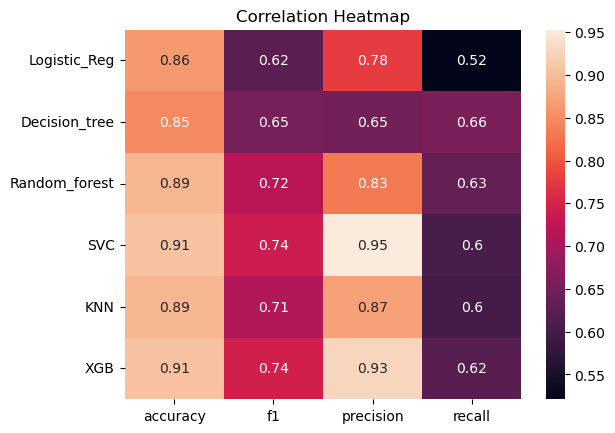

In [76]:
sns.heatmap(results, annot=True)
plt.title('Correlation Heatmap')
plt.show()

# Cross Validation Check

In [77]:
from sklearn.model_selection import cross_val_score, RandomizedSearchCV

In [78]:
model_r = RandomForestClassifier()

In [79]:
scores = cross_val_score(model_r, X, y, cv=5,verbose=2)

[CV] END .................................................... total time=   2.2s
[CV] END .................................................... total time=   2.0s
[CV] END .................................................... total time=   2.0s
[CV] END .................................................... total time=   1.9s
[CV] END .................................................... total time=   2.0s


In [80]:
scores.mean()

0.89027012516863

In [81]:
model_xgb = XGBClassifier()

In [82]:
scores_xgb = cross_val_score(model_xgb, X, y, cv=5,verbose=2)

[CV] END .................................................... total time=   0.1s
[CV] END .................................................... total time=   0.1s
[CV] END .................................................... total time=   0.1s
[CV] END .................................................... total time=   0.1s
[CV] END .................................................... total time=   0.1s


In [83]:
scores.mean()

0.89027012516863

# Applying RandomSearchCV

In [84]:
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [3, 4, 5, 6, 8, 10],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2, 0.3],
    'min_child_weight': [1, 3, 5, 7]
}

# Randomized search setup
random_search = RandomizedSearchCV(
    estimator=model_xgb,
    param_distributions=param_dist,
    n_iter=40,                 # number of random combinations to try
    scoring='f1',
    cv=5,                      # 3-fold cross validation
    verbose=2,
    random_state=42,
    n_jobs=-1                  # use all CPU cores
)

In [85]:
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, device=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           feature_weights=None, gamma=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constrain...
                                           n_estimators=None, n_jobs=None,
                                           num_parallel_tree=None, ...),
                   n_iter=40, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.6, 0.7, 0.8, 0.9,
                                                             1.0],
                                        'gamma': [0, 0.1, 0.2, 0.3],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.2],
                                        'max_depth': [3, 4, 5, 6, 8, 10],
                                        'min_child_weight': [1, 3, 5, 7],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500],
                                        'subsample': [0.6, 0.7, 0.8, 0.9, 1.0]},
                   random_state=42, scoring='f1', verbose=2)

In [86]:
random_search.best_params_

{'subsample': 0.7,
 'n_estimators': 200,
 'min_child_weight': 3,
 'max_depth': 8,
 'learning_rate': 0.1,
 'gamma': 0.3,
 'colsample_bytree': 0.7}

In [87]:
model_x = XGBClassifier( subsample=0.7,
 n_estimators=300,
 min_child_weight=1,
 max_depth=10,
 learning_rate=0.01,
 gamma=0.2,
 colsample_bytree=0.6)

In [88]:
model_xg = XGBClassifier(random_search.best_params_)

In [89]:
model_x.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=0.2, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
              max_leaves=None, min_child_weight=1, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=300,
              n_jobs=None, num_parallel_tree=None, ...)

In [90]:
y_pred = model_x.predict(X_test)

In [92]:
from sklearn.metrics import roc_curve, roc_auc_score

def evaluate(y_test,y_pred):
  confusion = confusion_matrix(y_test, y_pred)
  sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues')
  plt.title('Confusion Matrix')
  plt.xlabel('Predicted Labels')
  plt.ylabel('True Labels')
  plt.show()

  accuracy = accuracy_score(y_test, y_pred)
  f1 = f1_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred)
  recall = recall_score(y_test, y_pred)

  print(f"Accuracy: {accuracy}")
  print(f"F1 Score: {f1}")
  print(f"Precision: {precision}")
  print(f"Recall: {recall}")

  # Get FPR, TPR
  fpr, tpr, thresholds = roc_curve(y_test, y_pred)

  # Compute AUC
  auc = roc_auc_score(y_test, y_pred)

  # Plot
  plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {auc:.2f})')
  plt.plot([0, 1], [0, 1], 'k--')  # diagonal line (random model)
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.title('ROC Curve')
  plt.legend()
  plt.show()

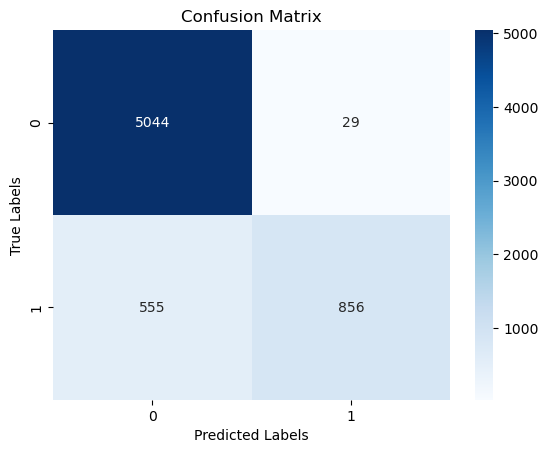

Accuracy: 0.9099321406539174
F1 Score: 0.7456445993031359
Precision: 0.9672316384180791
Recall: 0.6066619418851878


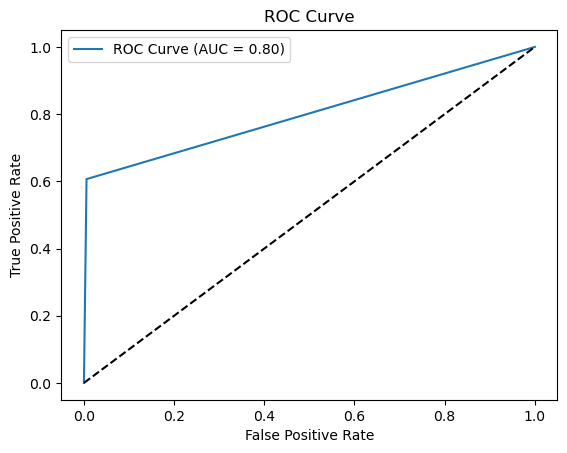

In [93]:
evaluate(y_test,y_pred)

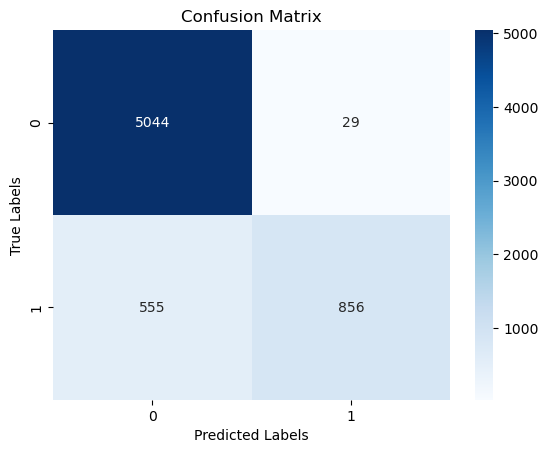

In [94]:
confusion = confusion_matrix(y_test, y_pred)
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

In [95]:
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)

In [96]:
print(f"Accuracy: {accuracy}")
print(f"F1 Score: {f1}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")

Accuracy: 0.9099321406539174
F1 Score: 0.7456445993031359
Precision: 0.9672316384180791
Recall: 0.6066619418851878


In [97]:
best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)

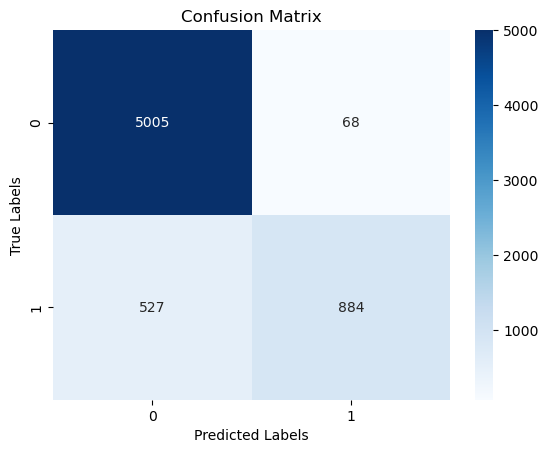

Accuracy: 0.9082356570018507
F1 Score: 0.7482014388489209
Precision: 0.9285714285714286
Recall: 0.6265060240963856


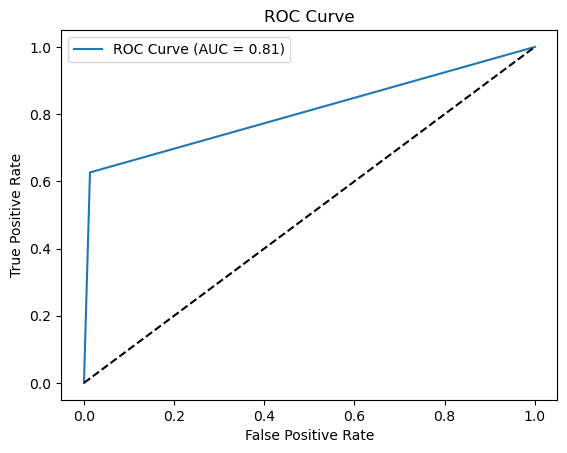

In [98]:
evaluate(y_test,y_pred)

In [99]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

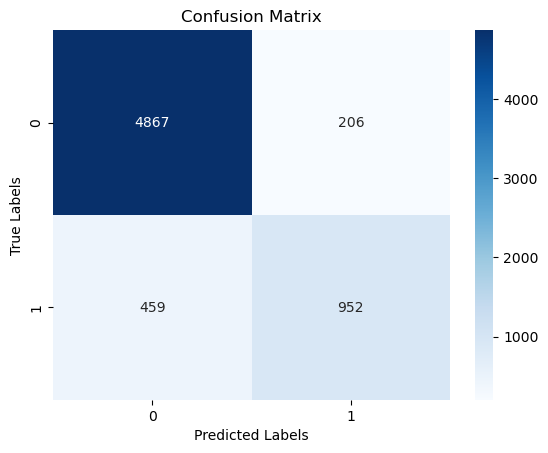

Accuracy: 0.8974398519432449
F1 Score: 0.7411444141689373
Precision: 0.8221070811744386
Recall: 0.6746987951807228


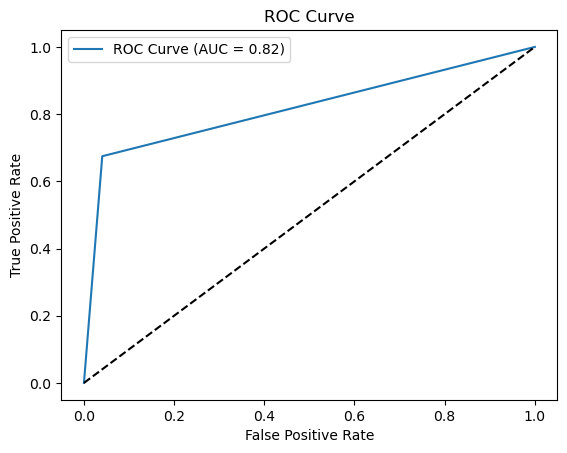

In [100]:
model_x.fit(X_train_resampled,y_train_resampled)
y_p = model_x.predict(X_test)
evaluate(y_test,y_p)

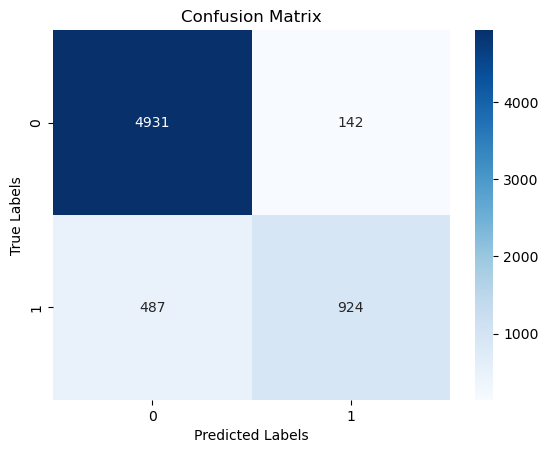

Accuracy: 0.9029919802590993
F1 Score: 0.746063786838918
Precision: 0.8667917448405253
Recall: 0.6548547129695251


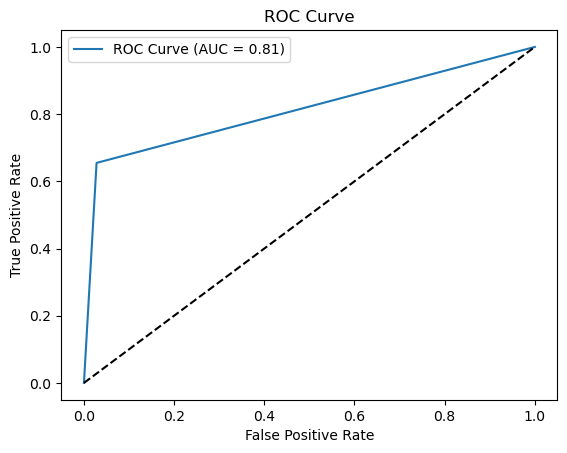

In [101]:
best_model.fit(X_train_resampled,y_train_resampled)
y_p = best_model.predict(X_test)
evaluate(y_test,y_p)

### RandomSearchCv on RandomForest

In [ ]:
rf = RandomForestClassifier(random_state=42)

# Define hyperparameter grid
param_dist = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False]
}

# Randomized search
rf_random = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_dist,
    n_iter=30,                 # number of random combinations to try
    cv=5,                      # 5-fold cross validation
    verbose=2,                 # print progress
    random_state=42,
    n_jobs=-1                  # use all CPU cores
)

# Fit the model
rf_random.fit(X_train, y_train)

# Best parameters
print("Best Parameters:", rf_random.best_params_)

# Best model
best_rf = rf_random.best_estimator_

# Evaluate
print("Training Accuracy:", best_rf.score(X_train, y_train))
print("Test Accuracy:", best_rf.score(X_test, y_test))


Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best Parameters: {'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': None, 'bootstrap': True}
Training Accuracy: 0.9182091624248033
Test Accuracy: 0.9090067859346083


In [ ]:
parameter = random_search.best_params_

In [ ]:
parameter

{'subsample': 0.9,
 'n_estimators': 200,
 'min_child_weight': 5,
 'max_depth': 8,
 'learning_rate': 0.1,
 'gamma': 0.2,
 'colsample_bytree': 0.8}

In [ ]:
model_rf = RandomForestClassifier(**rf_random.best_params_)

In [ ]:
model_rf.fit(X_train,y_train)

RandomForestClassifier(max_features='log2', min_samples_leaf=2,
                       min_samples_split=10)

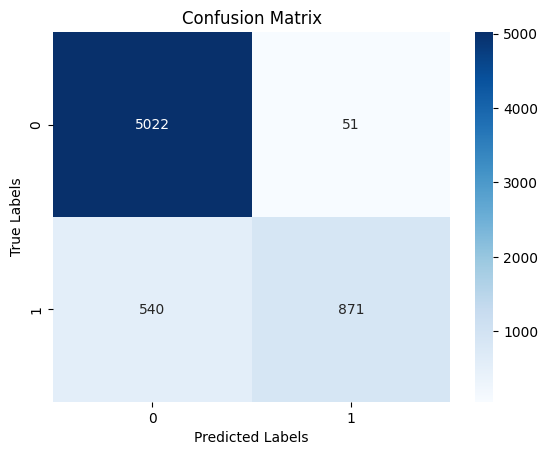

Accuracy: 0.9088525601480567
F1 Score: 0.7466780968709815
Precision: 0.9446854663774403
Recall: 0.6172927002126152


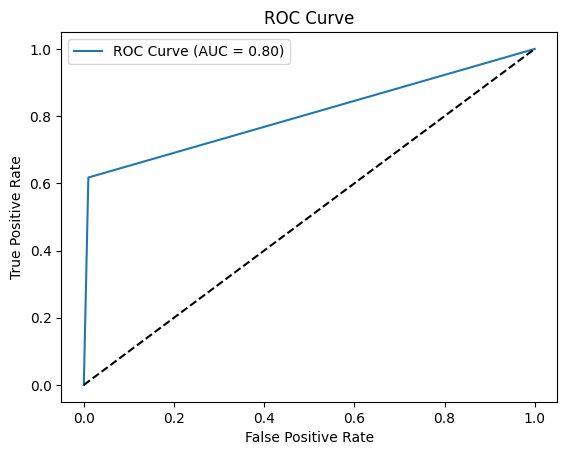

In [ ]:
y_pred = model_rf.predict(X_test)
evaluate(y_test,y_pred)

# Building Pipeline

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.impute import KNNImputer

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.impute import KNNImputer


def map_yes_no(df):
    return df.replace({'Y': 1, 'N': 0})


def buildPipeline(num_att, cat_att):
  num_pipeline = Pipeline(
      [
          ('Imputer', KNNImputer(n_neighbors=5)),
          ('Scaler', StandardScaler())
      ]
  )

  cat_pipeline = Pipeline(
      [
          ('mapper', FunctionTransformer(map_yes_no)),
          ('OneHotEncoder', OneHotEncoder(handle_unknown='ignore')) # Added handle_unknown='ignore' for robustness
      ]
  )

  full_pipeline = ColumnTransformer(
      [
          ('num', num_pipeline, num_att),
          ('cat', cat_pipeline, cat_att),
      ],
      remainder='passthrough' # Keep other columns (like the target variable)
  )

  return full_pipeline

In [ ]:
pipeline = buildPipeline(num_col, cat_col)

In [103]:
cat_col = [col for col in df.select_dtypes(['object']).columns.tolist() if col not in ['emp_length_cat']]

In [104]:
cat_col

['person_home_ownership', 'loan_intent', 'loan_grade']

In [112]:
df_test = pd.read_csv("credit_risk_dataset.csv")

In [113]:
cat_attribs = df_test.select_dtypes(exclude=[np.number]).columns.tolist()

In [114]:
cat_attribs

['person_home_ownership',
 'loan_intent',
 'loan_grade',
 'cb_person_default_on_file']

In [ ]:
df_copy = df.drop('emp_length_cat', axis=1)

In [ ]:
X = df_copy.drop('loan_status', axis=1)
y = df_copy['loan_status']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [105]:
num_col

['person_age',
 'person_income',
 'person_emp_length',
 'loan_amnt',
 'loan_int_rate',
 'loan_percent_income',
 'cb_person_cred_hist_length']

In [ ]:
pipeline.fit(X_train,y_train)

ColumnTransformer(remainder='passthrough',
                  transformers=[('num',
                                 Pipeline(steps=[('Imputer', KNNImputer()),
                                                 ('Scaler', StandardScaler())]),
                                 ['person_age', 'person_income',
                                  'person_emp_length', 'loan_amnt',
                                  'loan_int_rate', 'loan_percent_income',
                                  'cb_person_cred_hist_length']),
                                ('cat',
                                 Pipeline(steps=[('mapper',
                                                  FunctionTransformer(func=<function map_yes_no at 0x7f48ec3bc360>)),
                                                 ('OneHotEncoder',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['person_home_ownership', 'loan_intent',
                                  'loan_grade'])])

In [ ]:
from xgboost import XGBClassifier


MODEL = XGBClassifier(
 subsample=0.7,
 n_estimators=300,
 min_child_weight=1,
 max_depth=10,
 learning_rate=0.01,
 gamma=0.2,
 colsample_bytree=0.6
)

In [ ]:
MODEL.fit(pipeline.transform(X_train),y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=0.2, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
              max_leaves=None, min_child_weight=1, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=300,
              n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_pred = MODEL.predict(pipeline.transform(X_test))

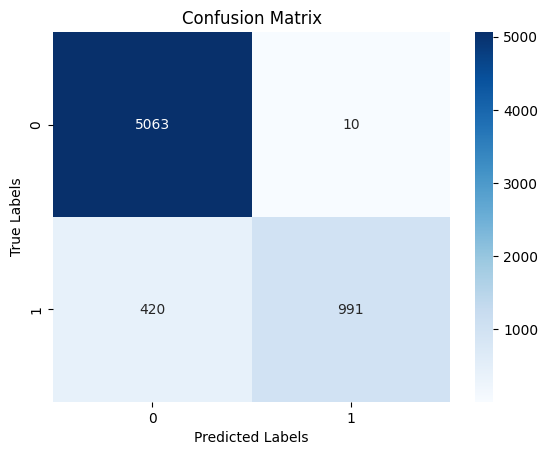

Accuracy: 0.9336829117828501
F1 Score: 0.8217247097844113
Precision: 0.99000999000999
Recall: 0.702338766832034


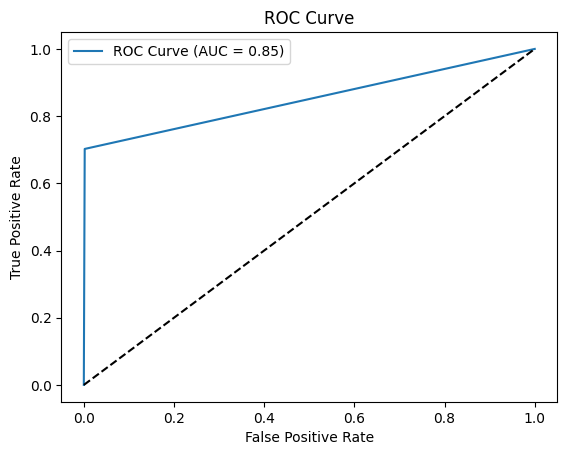

In [ ]:
evaluate(y_test,y_pred)